# Libraries

In [2]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

import pickle

from sklearn.linear_model import LogisticRegression

import matplotlib.pyplot as plt
import matplotlib.axes as axs
%matplotlib inline
import seaborn as sns
sns.set()

from sklearn.linear_model import LinearRegression

# Data Preparation

In [4]:
# Load data
df_purchase = pd.read_csv('purchase+data.csv')
# Import Scaler
scaler = pickle.load(open('scaler.pickle', 'rb'))
# Import PCA
pca = pickle.load(open('pca.pickle', 'rb'))
# Import K-Means
kmeans_pca = pickle.load(open('kmeans_pca.pickle', 'rb'))
# Standardization
features = df_purchase[['Sex','Marital status','Age','Education','Income','Occupation','Settlement size']]
df_purchase_segm_std = scaler.transform(features)
# Apply PCA
df_purchase_segm_pca = pca.transform(df_purchase_segm_std)  
# Segment data
purchase_segm_kmeans_pca = kmeans_pca.predict(df_purchase_segm_pca)

# Create a copy of the dataframe
df_purchase_predictors = df_purchase.copy()
# Add segment labels
df_purchase_predictors['Segment'] = purchase_segm_kmeans_pca
segment_dummies = pd.get_dummies(purchase_segm_kmeans_pca, prefix='Segment', prefix_sep='_')
df_purchase_predictors = pd.concat([df_purchase_predictors, segment_dummies], axis=1)

df_pa = df_purchase_predictors

# Purchase Probability Model

In [6]:
Y = df_pa['Incidence']

In [7]:
X = pd.DataFrame()
X['Mean_Price'] = (df_pa['Price_1'] +
                   df_pa['Price_2'] +
                   df_pa['Price_3'] +
                   df_pa['Price_4'] +
                   df_pa['Price_5'] ) / 5

Purchase probability is influenced by Price.

In [9]:
model_purchase = LogisticRegression(solver='sag')
model_purchase.fit(X, Y)

LogisticRegression(solver='sag')

In [10]:
model_purchase.coef_

array([[-2.34816376]])

The model quantifies the exact relationship between price and purchase probability. 

A negative coefficient for price indicates that as the price increases, the purchase probability decreases.

# Price Elasticity of Purchase Porbability

“If the price goes up or down, how much does that affect the likelihood of someone buying the product?”

The more people change their buying behavior when prices change, the more "elastic" the product is.

Price elasticity of purchase probability -> % change in purchase probability in response to a 1% change in price

In [17]:
# We want to check different values for the mean price and see how they affect the purchase probability
# We can define a range of prices and analyze each one of them

In [18]:
df_pa[['Price_1', 'Price_2', 'Price_3', 'Price_4', 'Price_5']].describe()

,Price_1,Price_2,Price_3,Price_4,Price_5
count,58693.000000,58693.000000,58693.000000,58693.000000,58693.000000
mean,1.392074,1.780999,2.006789,2.159945,2.654798
std,0.091139,0.170868,0.046867,0.089825,0.098272
min,1.100000,1.260000,1.870000,1.760000,2.110000
25%,1.340000,1.580000,1.970000,2.120000,2.630000
50%,1.390000,1.880000,2.010000,2.170000,2.670000
75%,1.470000,1.890000,2.060000,2.240000,2.700000
max,1.590000,1.900000,2.140000,2.260000,2.800000


In [19]:
# This range is used to test the model's predictions.
price_range = np.arange(0.5, 3.5, 0.01)
price_range

array([0.5 , 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 ,
       0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71,
       0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82,
       0.83, 0.84, 0.85, 0.86, 0.87, 0.88, 0.89, 0.9 , 0.91, 0.92, 0.93,
       0.94, 0.95, 0.96, 0.97, 0.98, 0.99, 1.  , 1.01, 1.02, 1.03, 1.04,
       1.05, 1.06, 1.07, 1.08, 1.09, 1.1 , 1.11, 1.12, 1.13, 1.14, 1.15,
       1.16, 1.17, 1.18, 1.19, 1.2 , 1.21, 1.22, 1.23, 1.24, 1.25, 1.26,
       1.27, 1.28, 1.29, 1.3 , 1.31, 1.32, 1.33, 1.34, 1.35, 1.36, 1.37,
       1.38, 1.39, 1.4 , 1.41, 1.42, 1.43, 1.44, 1.45, 1.46, 1.47, 1.48,
       1.49, 1.5 , 1.51, 1.52, 1.53, 1.54, 1.55, 1.56, 1.57, 1.58, 1.59,
       1.6 , 1.61, 1.62, 1.63, 1.64, 1.65, 1.66, 1.67, 1.68, 1.69, 1.7 ,
       1.71, 1.72, 1.73, 1.74, 1.75, 1.76, 1.77, 1.78, 1.79, 1.8 , 1.81,
       1.82, 1.83, 1.84, 1.85, 1.86, 1.87, 1.88, 1.89, 1.9 , 1.91, 1.92,
       1.93, 1.94, 1.95, 1.96, 1.97, 1.98, 1.99, 2.

In [20]:
df_price_range = pd.DataFrame(price_range)

In [21]:
# It uses the fitted Logistic Regression model to predict the probability of purchase for every price
Y_pr = model_purchase.predict_proba(df_price_range)

D:\anaconda\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


In [22]:
Y_pr

array([[0.08210742, 0.91789258],
       [0.08389458, 0.91610542],
       [0.08571702, 0.91428298],
       [0.08757526, 0.91242474],
       [0.08946984, 0.91053016],
       [0.0914013 , 0.9085987 ],
       [0.09337018, 0.90662982],
       [0.09537702, 0.90462298],
       [0.09742236, 0.90257764],
       [0.09950674, 0.90049326],
       [0.10163069, 0.89836931],
       [0.10379476, 0.89620524],
       [0.10599946, 0.89400054],
       [0.10824534, 0.89175466],
       [0.11053292, 0.88946708],
       [0.11286273, 0.88713727],
       [0.11523528, 0.88476472],
       [0.11765109, 0.88234891],
       [0.12011067, 0.87988933],
       [0.12261453, 0.87738547],
       [0.12516316, 0.87483684],
       [0.12775705, 0.87224295],
       [0.13039668, 0.86960332],
       [0.13308253, 0.86691747],
       [0.13581506, 0.86418494],
       [0.13859472, 0.86140528],
       [0.14142197, 0.85857803],
       [0.14429723, 0.85570277],
       [0.14722093, 0.85277907],
       [0.15019346, 0.84980654],
       [0.

In [23]:
# The first column represents the probability of the outcome being 0 (no purchase)
# The second column represents the probability of the outcome being 1 (purchase)

In [24]:
# We're only interested in purchase probabilities
purchase_pr = Y_pr[:][:,1]

The predicted probabilities show that as the price increases (down the array), the purchase probability (second column) generally decreases.

#### How does demand for the product change with a given change in price ?

With the help of price elasticity

In [28]:
pe = model_purchase.coef_[:,0] * price_range * (1 - purchase_pr)
# We get an array containing the price elasticities at each price point

In [29]:
df_price_elasticities = pd.DataFrame(price_range)

In [30]:
df_price_elasticities = df_price_elasticities.rename(columns = {0: "Price_Point"})
df_price_elasticities['Mean_PE'] = pe
df_price_elasticities

,Price_Point,Mean_PE
0,0.50,-0.096401
1,0.51,-0.100469
2,0.52,-0.104664
3,0.53,-0.108990
4,0.54,-0.113449
...,...,...
295,3.45,-8.013298
296,3.46,-8.038548
297,3.47,-8.063764
298,3.48,-8.088946


In [31]:
# This will help us to determine the average customer's purchase behaviour

In [32]:
pd.options.display.max_rows = None
df_price_elasticities

,Price_Point,Mean_PE
0,0.50,-0.096401
1,0.51,-0.100469
2,0.52,-0.104664
3,0.53,-0.108990
4,0.54,-0.113449
5,0.55,-0.118044
6,0.56,-0.122779
7,0.57,-0.127658
8,0.58,-0.132683
9,0.59,-0.137858


If |E| < 1 -> inelastic purchase probability

If [E} >= 1  -> elastic purchase probability

For inelastic values, we increase our prices.

For elastic values, we decrease our prices.

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

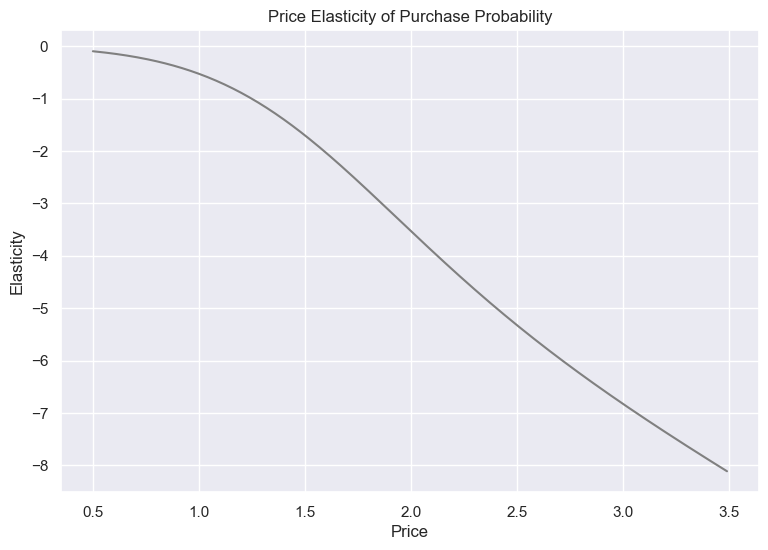

In [35]:
plt.figure(figsize= (9,6))
plt.plot(price_range, pe, color = 'grey')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

For any price below 1.25, the company should raise the price to increase revenue.

For any price above 1.25, the company should lower the price to increase revenue.

# Purchase Probability by Segments

## Segment 1 - Urban Achievers

In [39]:
df_pa_segment_1 = df_pa[df_pa['Segment'] == 0]

In [40]:
Y = df_pa_segment_1['Incidence']

In [41]:
X = pd.DataFrame()

In [42]:
X['Mean_Price'] = (df_pa_segment_1['Price_1'] +
                   df_pa_segment_1['Price_2'] +
                   df_pa_segment_1['Price_3'] +
                   df_pa_segment_1['Price_4'] +
                   df_pa_segment_1['Price_5'] ) / 5

In [43]:
model_incidence_segment_1 = LogisticRegression(solver = 'sag')
model_incidence_segment_1.fit(X, Y)

LogisticRegression(solver='sag')

In [44]:
model_incidence_segment_1.coef_

array([[-2.48937523]])

Segment 1 consumers have higher coefficient compared to average consumers.
Therefore, it will have a higher impact when we calculate the elasticities.

#### Will this segment be more elastic than our average customer ?

In [47]:
Y_segment_1 = model_incidence_segment_1.predict_proba(df_price_range)
purchase_pr_segment_1 = Y_segment_1[:][:,1]
pe_segment_1 = model_incidence_segment_1.coef_[:,0] * price_range * (1 - purchase_pr_segment_1)

D:\anaconda\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


### Results 

In [49]:
df_price_elasticities['PE_Segment_1'] = pe_segment_1
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1
0,0.50,-0.096401,-0.068948
1,0.51,-0.100469,-0.071999
2,0.52,-0.104664,-0.075154
3,0.53,-0.108990,-0.078416
4,0.54,-0.113449,-0.081786
5,0.55,-0.118044,-0.085270
6,0.56,-0.122779,-0.088869
7,0.57,-0.127658,-0.092587
8,0.58,-0.132683,-0.096428
9,0.59,-0.137858,-0.100394


Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

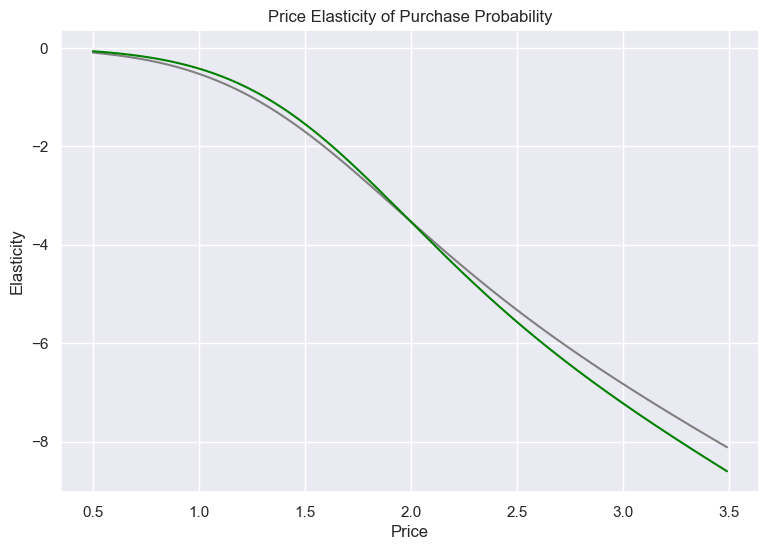

In [50]:
plt.figure(figsize= (9,6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

Yes, Segment 1 ("Urban Achievers") is more price elastic than the average consumer.

The difference between the curves is relatively small at very low prices but grows as the price increases.

If you plan to raise the price, the change in purchase probability for the Urban Achievers segment will be more severe than for the general population.

If the price is kept low (e.g., below 1.5), the difference in sensitivity between the segment and the average consumer is minimal, suggesting that a low-price strategy would affect both groups similarly.

## Segment 2 - Rural Beginners

In [55]:
# Select only customers from segment 2
df_pa_segment_2 = df_pa[df_pa['Segment'] == 1]

In [56]:
Y = df_pa_segment_2['Incidence']

X = pd.DataFrame()

X['Mean_Price'] = (df_pa_segment_2['Price_1'] +
                   df_pa_segment_2['Price_2'] +
                   df_pa_segment_2['Price_3'] +
                   df_pa_segment_2['Price_4'] +
                   df_pa_segment_2['Price_5'] ) / 5

model_incidence_segment_2 = LogisticRegression(solver = 'sag')
model_incidence_segment_2.fit(X, Y)

model_incidence_segment_2.coef_
Y_segment_2 = model_incidence_segment_2.predict_proba(df_price_range)
purchase_pr_segment_2 = Y_segment_2[:][:,1]
pe_segment_2= model_incidence_segment_2.coef_[:,0] * price_range * (1 - purchase_pr_segment_2)

D:\anaconda\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


### Results

In [58]:
df_price_elasticities['PE_Segment_2'] = pe_segment_2
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1,PE_Segment_2
0,0.50,-0.096401,-0.068948,-0.095627
1,0.51,-0.100469,-0.071999,-0.099945
2,0.52,-0.104664,-0.075154,-0.104413
3,0.53,-0.108990,-0.078416,-0.109036
4,0.54,-0.113449,-0.081786,-0.113817
5,0.55,-0.118044,-0.085270,-0.118760
6,0.56,-0.122779,-0.088869,-0.123871
7,0.57,-0.127658,-0.092587,-0.129154
8,0.58,-0.132683,-0.096428,-0.134613
9,0.59,-0.137858,-0.100394,-0.140254


Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

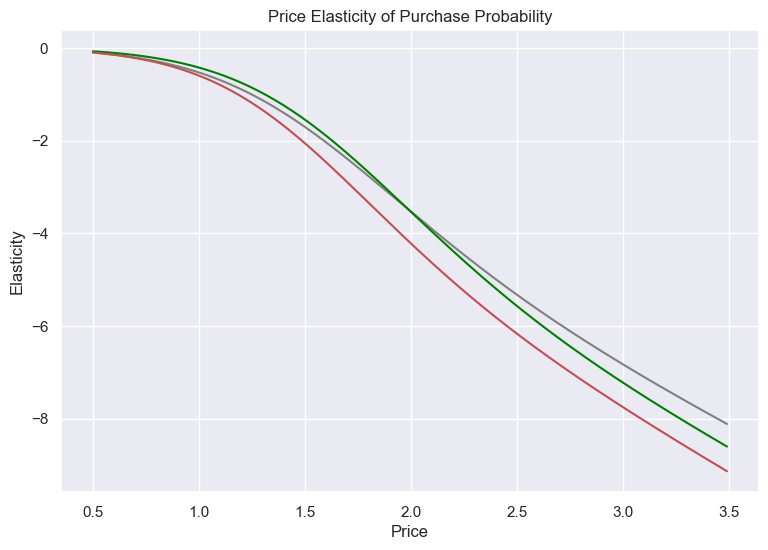

In [59]:
plt.figure(figsize= (9,6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.plot(price_range, pe_segment_2, color = 'r')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

For any given price increase, the purchase probability of customers in Segment 2 will drop the most compared to Segment 1 and the average customer.

A lower pricing strategy or frequent promotions would be most effective for maximizing volume from this group.

# Segment 3 - Suburban Families

In [63]:
df_pa_segment_3 = df_pa[df_pa['Segment'] == 2]

In [64]:
Y = df_pa_segment_3['Incidence']

X = pd.DataFrame()

X['Mean_Price'] = (df_pa_segment_3['Price_1'] +
                   df_pa_segment_3['Price_2'] +
                   df_pa_segment_3['Price_3'] +
                   df_pa_segment_3['Price_4'] +
                   df_pa_segment_3['Price_5'] ) / 5

model_incidence_segment_3 = LogisticRegression(solver = 'sag')
model_incidence_segment_3.fit(X, Y)

model_incidence_segment_3.coef_
Y_segment_3 = model_incidence_segment_3.predict_proba(df_price_range)
purchase_pr_segment_3 = Y_segment_3[:][:,1]
pe_segment_3 = model_incidence_segment_3.coef_[:,0] * price_range * (1 - purchase_pr_segment_3)

D:\anaconda\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


### Results

In [66]:
df_price_elasticities['PE_Segment_3'] = pe_segment_3
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1,PE_Segment_2,PE_Segment_3
0,0.50,-0.096401,-0.068948,-0.095627,-0.177588
1,0.51,-0.100469,-0.071999,-0.099945,-0.183589
2,0.52,-0.104664,-0.075154,-0.104413,-0.189712
3,0.53,-0.108990,-0.078416,-0.109036,-0.195957
4,0.54,-0.113449,-0.081786,-0.113817,-0.202325
5,0.55,-0.118044,-0.085270,-0.118760,-0.208818
6,0.56,-0.122779,-0.088869,-0.123871,-0.215438
7,0.57,-0.127658,-0.092587,-0.129154,-0.222185
8,0.58,-0.132683,-0.096428,-0.134613,-0.229061
9,0.59,-0.137858,-0.100394,-0.140254,-0.236068


Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

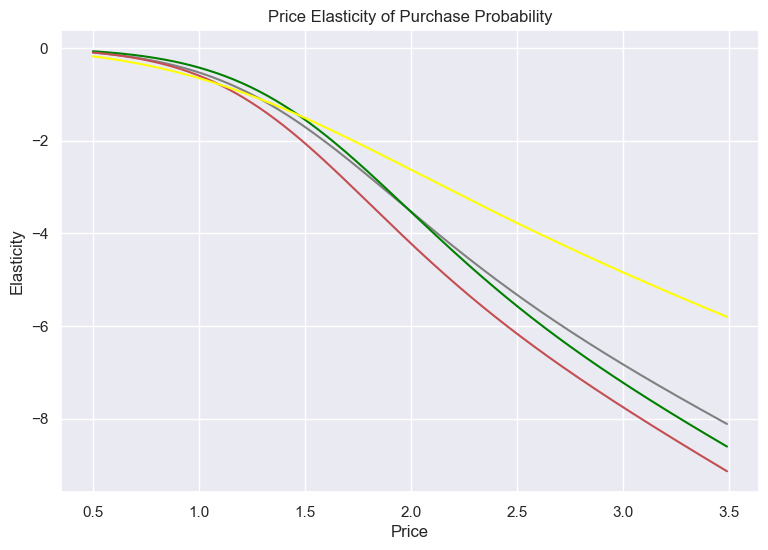

In [67]:
plt.figure(figsize= (9,6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.plot(price_range, pe_segment_2, color = 'r')
plt.plot(price_range, pe_segment_3, color = 'yellow')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

# Segment 4 - Elite Professionals

In [69]:
df_pa_segment_4 = df_pa[df_pa['Segment'] == 3]

In [70]:
Y = df_pa_segment_4['Incidence']

X = pd.DataFrame()

X['Mean_Price'] = (df_pa_segment_4['Price_1'] +
                   df_pa_segment_4['Price_2'] +
                   df_pa_segment_4['Price_3'] +
                   df_pa_segment_4['Price_4'] +
                   df_pa_segment_4['Price_5'] ) / 5

model_incidence_segment_4 = LogisticRegression(solver = 'sag')
model_incidence_segment_4.fit(X, Y)

model_incidence_segment_4.coef_
Y_segment_4 = model_incidence_segment_4.predict_proba(df_price_range)
purchase_pr_segment_4 = Y_segment_4[:][:,1]
pe_segment_4 = model_incidence_segment_4.coef_[:,0] * price_range * (1 - purchase_pr_segment_4)

D:\anaconda\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


### Results

In [72]:
df_price_elasticities['PE_Segment_4'] = pe_segment_4
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_4
0,0.50,-0.096401,-0.068948,-0.095627,-0.177588,-0.159237
1,0.51,-0.100469,-0.071999,-0.099945,-0.183589,-0.164198
2,0.52,-0.104664,-0.075154,-0.104413,-0.189712,-0.169243
3,0.53,-0.108990,-0.078416,-0.109036,-0.195957,-0.174373
4,0.54,-0.113449,-0.081786,-0.113817,-0.202325,-0.179587
5,0.55,-0.118044,-0.085270,-0.118760,-0.208818,-0.184888
6,0.56,-0.122779,-0.088869,-0.123871,-0.215438,-0.190275
7,0.57,-0.127658,-0.092587,-0.129154,-0.222185,-0.195749
8,0.58,-0.132683,-0.096428,-0.134613,-0.229061,-0.201312
9,0.59,-0.137858,-0.100394,-0.140254,-0.236068,-0.206963


Text(0.5, 1.0, 'Price Elasticity of Purchase Probability')

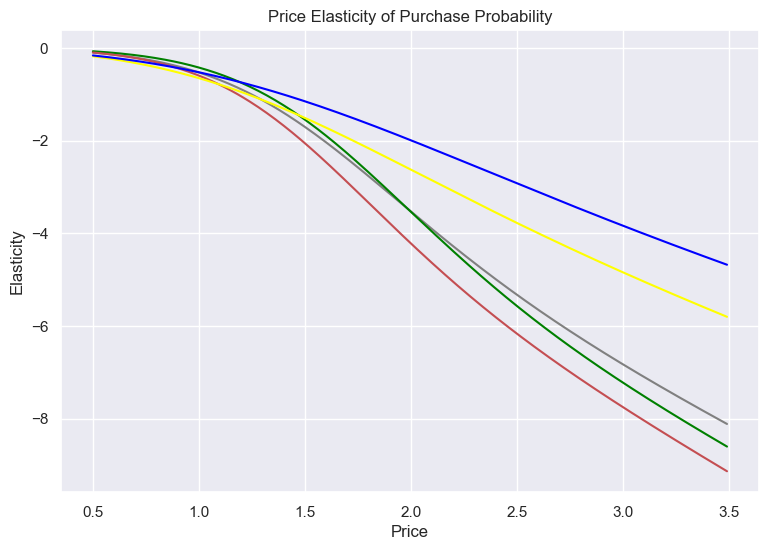

In [73]:
plt.figure(figsize= (9,6))
plt.plot(price_range, pe, color = 'grey')
plt.plot(price_range, pe_segment_1, color = 'green')
plt.plot(price_range, pe_segment_2, color = 'r')
plt.plot(price_range, pe_segment_3, color = 'yellow')
plt.plot(price_range, pe_segment_4, color = 'blue')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability')

Apart from price, there also may be other factors which affect a customer's decision whether to buy a product as well.

# Purchase Probability with Promotion Feature

### Data Preparation

In [77]:
Y = df_pa['Incidence']

In [78]:
X = pd.DataFrame()
X['Mean_Price'] = (df_pa['Price_1'] +
                   df_pa['Price_2'] +
                   df_pa['Price_3'] +
                   df_pa['Price_4'] +
                   df_pa['Price_5'] ) / 5
X.columns = X.columns.astype(str)

In [79]:
# We calculate average promotional activities across all brands
X['Mean_Promotion'] = (df_pa['Promotion_1'] +
                       df_pa['Promotion_2'] +
                       df_pa['Promotion_3'] +
                       df_pa['Promotion_4'] +
                       df_pa['Promotion_5'] ) / 5
X

,Mean_Price,Mean_Promotion
0,2.044,0.2
1,2.028,0.0
2,2.028,0.0
3,2.028,0.0
4,2.030,0.0
5,2.028,0.0
6,2.030,0.0
7,2.030,0.0
8,1.932,0.6
9,1.932,0.6


# Model Estimation

In [81]:
model_incidence_promotion = LogisticRegression(solver='sag')
model_incidence_promotion.fit(X,Y)
model_incidence_promotion.coef_

array([[-1.49403341,  0.56156   ]])

Positive coefficient for promotion indicates that with the increase in promotion, the purchase probability also increases.

# Price Elasticity with Promotion

In [84]:
# Currently, we're interested in the overall effect of promotion activities on elasticities
# So lets explore two cases - one where there are promotional activities for all brands at all price points, and another where there are no promotions at all.

In [85]:
# prediction DataFrame:

# 1. Create a DataFrame with the 'Mean_Price' column using the price range
df_prediction = pd.DataFrame({'Mean_Price': price_range})

# 2. Add the 'Mean_Promotion' column, setting it to 1 for this scenario
df_prediction['Mean_Promotion'] = 1 

# 3. Convert all column names to string (as a final safeguard)
df_prediction.columns = df_prediction.columns.astype(str)

# 4. Predict
Y_promotion = model_incidence_promotion.predict_proba(df_prediction)

In [86]:
promo = Y_promotion[:, 1]
price_elasticity_promo = (model_incidence_promotion.coef_[:,0] * price_range) * (1 - promo)

In [87]:
df_price_elasticities['Elasticity_Promotion_1'] = price_elasticity_promo
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_4,Elasticity_Promotion_1
0,0.50,-0.096401,-0.068948,-0.095627,-0.177588,-0.159237,-0.125757
1,0.51,-0.100469,-0.071999,-0.099945,-0.183589,-0.164198,-0.129874
2,0.52,-0.104664,-0.075154,-0.104413,-0.189712,-0.169243,-0.134070
3,0.53,-0.108990,-0.078416,-0.109036,-0.195957,-0.174373,-0.138346
4,0.54,-0.113449,-0.081786,-0.113817,-0.202325,-0.179587,-0.142702
5,0.55,-0.118044,-0.085270,-0.118760,-0.208818,-0.184888,-0.147141
6,0.56,-0.122779,-0.088869,-0.123871,-0.215438,-0.190275,-0.151663
7,0.57,-0.127658,-0.092587,-0.129154,-0.222185,-0.195749,-0.156268
8,0.58,-0.132683,-0.096428,-0.134613,-0.229061,-0.201312,-0.160959
9,0.59,-0.137858,-0.100394,-0.140254,-0.236068,-0.206963,-0.165735


In [88]:
# 1. Create a DataFrame with the 'Mean_Price' column using the price range
df_predictions = pd.DataFrame({'Mean_Price': price_range})

# 2. Add the 'Mean_Promotion' column, setting it to 1 for this scenario
df_predictions['Mean_Promotion'] = 0 

# 3. Convert all column names to string (as a final safeguard)
df_predictions.columns = df_predictions.columns.astype(str)

# 4. Predict
Y_no_promotion = model_incidence_promotion.predict_proba(df_predictions)

In [89]:
no_promo = Y_no_promotion[:, 1]
price_elasticity_no_promo = (model_incidence_promotion.coef_[:,0] * price_range) * (1 - no_promo)

In [90]:
df_price_elasticities['Elasticity_Promotion_0'] = price_elasticity_no_promo
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_4,Elasticity_Promotion_1,Elasticity_Promotion_0
0,0.50,-0.096401,-0.068948,-0.095627,-0.177588,-0.159237,-0.125757,-0.195684
1,0.51,-0.100469,-0.071999,-0.099945,-0.183589,-0.164198,-0.129874,-0.201807
2,0.52,-0.104664,-0.075154,-0.104413,-0.189712,-0.169243,-0.134070,-0.208032
3,0.53,-0.108990,-0.078416,-0.109036,-0.195957,-0.174373,-0.138346,-0.214360
4,0.54,-0.113449,-0.081786,-0.113817,-0.202325,-0.179587,-0.142702,-0.220792
5,0.55,-0.118044,-0.085270,-0.118760,-0.208818,-0.184888,-0.147141,-0.227329
6,0.56,-0.122779,-0.088869,-0.123871,-0.215438,-0.190275,-0.151663,-0.233972
7,0.57,-0.127658,-0.092587,-0.129154,-0.222185,-0.195749,-0.156268,-0.240722
8,0.58,-0.132683,-0.096428,-0.134613,-0.229061,-0.201312,-0.160959,-0.247579
9,0.59,-0.137858,-0.100394,-0.140254,-0.236068,-0.206963,-0.165735,-0.254544


#### Comparing Price Elasticities with and without Promotion

Text(0.5, 1.0, 'Price Elasticity of Purchase Probability with and without Promotion')

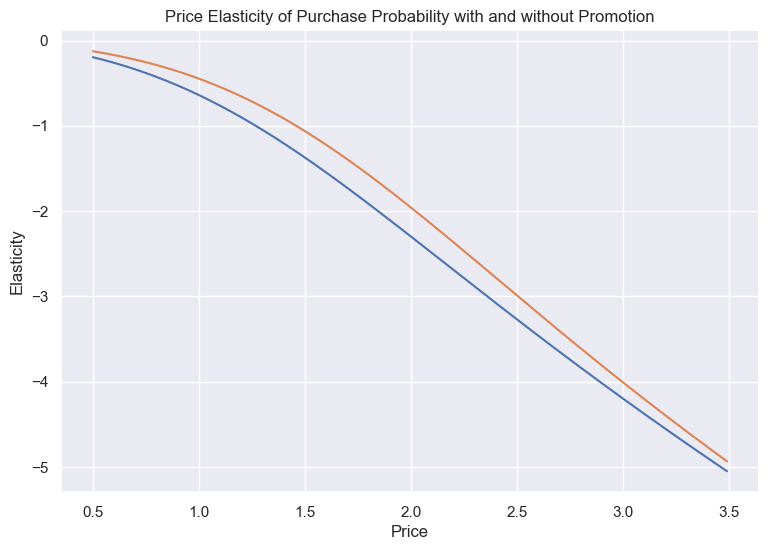

In [92]:
plt.figure(figsize= (9,6))
plt.plot(price_range, price_elasticity_no_promo)
plt.plot(price_range, price_elasticity_promo)
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Probability with and without Promotion')

The elasticity curve with promotion sits above no promotion for the entire price range.

Blue Line - This is your "normal" level of price sensitivity. If you change the price without offering anything extra, customers react strongly.

Orange Line - The promotion acts as a "buffer" or a "shield." Customers are happy about the deal, so they don't react as negatively to the underlying price. The promotion makes demand less sensitive.

The difference between the two lines is biggest when the price is high (around 3.5). This means promotions are most effective and most valuable when you are trying to sell your most expensive items.

# Brand Choice

The goal of our model will be to determine what the probability to choose a certain brand is.

This would help marketers analyze their customers behaviour. Based on that, they can boost their sales.

#### Data Preparation

In [100]:
# Selecting only those shopping occassions when a purchase was made
brand_choice = df_pa[df_pa['Incidence'] == 1]

In [101]:
pd.options.display.max_rows = 100
brand_choice

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,47,1,110866,1,0,0,True,False,False,False
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,...,47,1,110866,1,0,0,True,False,False,False
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,...,47,1,110866,1,0,0,True,False,False,False
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,...,47,1,110866,1,0,0,True,False,False,False
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,...,47,1,110866,1,0,0,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58621,200000500,296,1,2,6,0,0,1.48,1.89,2.01,...,42,1,120946,1,0,0,True,False,False,False
58648,200000500,460,1,1,12,0,0,1.35,1.57,2.02,...,42,1,120946,1,0,0,True,False,False,False
58674,200000500,641,1,2,7,0,0,1.50,1.85,2.06,...,42,1,120946,1,0,0,True,False,False,False
58687,200000500,697,1,2,6,0,0,1.42,1.51,1.97,...,42,1,120946,1,0,0,True,False,False,False


In [102]:
Y = brand_choice['Brand']

In [103]:
# Now we're interested in the prices of each brand and the interactions between them
brand_choice.columns.values

array(['ID', 'Day', 'Incidence', 'Brand', 'Quantity', 'Last_Inc_Brand',
       'Last_Inc_Quantity', 'Price_1', 'Price_2', 'Price_3', 'Price_4',
       'Price_5', 'Promotion_1', 'Promotion_2', 'Promotion_3',
       'Promotion_4', 'Promotion_5', 'Sex', 'Marital status', 'Age',
       'Education', 'Income', 'Occupation', 'Settlement size', 'Segment',
       'Segment_0', 'Segment_1', 'Segment_2', 'Segment_3'], dtype=object)

In [104]:
features = ['Price_1', 'Price_2', 'Price_3', 'Price_4', 'Price_5']
X = brand_choice[features]

In [105]:
model_brand_choice = LogisticRegression(solver = 'sag', multi_class = 'multinomial'  )
model_brand_choice.fit(X, Y)

LogisticRegression(multi_class='multinomial', solver='sag')

In [106]:
model_brand_choice.coef_

array([[-3.91596409,  0.65845988,  2.41769973,  0.7040802 , -0.2021143 ],
       [ 1.27460821, -1.87985507, -0.21265979, -0.20634374,  0.58786694],
       [ 1.62420821,  0.56211091,  0.50095068,  1.03952108,  0.45280459],
       [ 0.57453155,  0.39558691, -1.40062614, -1.2462472 ,  0.2493457 ],
       [ 0.44261612,  0.26369736, -1.30536448, -0.29101035, -1.08790293]])

In [107]:
bc_coef = pd.DataFrame(np.transpose(model_brand_choice.coef_))
coefficients = ['Coef_Brand_1', 'Coef_Brand_2', 'Coef_Brand_3', 'Coef_Brand_4', 'Coef_Brand_5']
bc_coef.columns = [coefficients]
prices = ['Price_1', 'Price_2', 'Price_3', 'Price_4', 'Price_5']
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)
bc_coef

,Coef_Brand_1,Coef_Brand_2,Coef_Brand_3,Coef_Brand_4,Coef_Brand_5
Price_1,-3.92,1.27,1.62,0.57,0.44
Price_2,0.66,-1.88,0.56,0.40,0.26
Price_3,2.42,-0.21,0.50,-1.40,-1.31
Price_4,0.70,-0.21,1.04,-1.25,-0.29
Price_5,-0.20,0.59,0.45,0.25,-1.09


# Own Price Elasticity Brand 5

Own Price Elasticity of Demand is just a way to understand how much people will change how much they buy something when its price goes up or down.

In [110]:
# Brand choice analysis is extremely useful from a brand perspective
# We'll focus on a specific brand to gain insight into developing a strategy to target customers.

In [111]:
# Firstly, we'll get to know about the effects of price changes to our own brand price
df_own_brand_5 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5['Price_1'] = brand_choice['Price_1'].mean()
df_own_brand_5['Price_2'] = brand_choice['Price_2'].mean()
df_own_brand_5['Price_3'] = brand_choice['Price_3'].mean()
df_own_brand_5['Price_4'] = brand_choice['Price_4'].mean()
df_own_brand_5['Price_5'] = price_range
df_own_brand_5

,Price_1,Price_2,Price_3,Price_4,Price_5
0,1.384559,1.764717,2.006694,2.159658,0.50
1,1.384559,1.764717,2.006694,2.159658,0.51
2,1.384559,1.764717,2.006694,2.159658,0.52
3,1.384559,1.764717,2.006694,2.159658,0.53
4,1.384559,1.764717,2.006694,2.159658,0.54
...,...,...,...,...,...
295,1.384559,1.764717,2.006694,2.159658,3.45
296,1.384559,1.764717,2.006694,2.159658,3.46
297,1.384559,1.764717,2.006694,2.159658,3.47
298,1.384559,1.764717,2.006694,2.159658,3.48


In [112]:
# we'll be predicting the purchase probability of brand 5 for diff price points 
predict_brand_5 = model_brand_choice.predict_proba(df_own_brand_5)

In [113]:
pr_own_brand_5 = predict_brand_5[:][:, 4]

In [114]:
beta5 = bc_coef.iloc[4, 4]
beta5

-1.09

In [115]:
own_price_elasticity_brand_5 = beta5 * price_range * (1 - pr_own_brand_5)

In [116]:
df_price_elasticities['Brand_5'] = own_price_elasticity_brand_5
pd.options.display.max_rows = None
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_4,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5
0,0.50,-0.096401,-0.068948,-0.095627,-0.177588,-0.159237,-0.125757,-0.195684,-0.049055
1,0.51,-0.100469,-0.071999,-0.099945,-0.183589,-0.164198,-0.129874,-0.201807,-0.050616
2,0.52,-0.104664,-0.075154,-0.104413,-0.189712,-0.169243,-0.134070,-0.208032,-0.052207
3,0.53,-0.108990,-0.078416,-0.109036,-0.195957,-0.174373,-0.138346,-0.214360,-0.053827
4,0.54,-0.113449,-0.081786,-0.113817,-0.202325,-0.179587,-0.142702,-0.220792,-0.055477
5,0.55,-0.118044,-0.085270,-0.118760,-0.208818,-0.184888,-0.147141,-0.227329,-0.057158
6,0.56,-0.122779,-0.088869,-0.123871,-0.215438,-0.190275,-0.151663,-0.233972,-0.058871
7,0.57,-0.127658,-0.092587,-0.129154,-0.222185,-0.195749,-0.156268,-0.240722,-0.060615
8,0.58,-0.132683,-0.096428,-0.134613,-0.229061,-0.201312,-0.160959,-0.247579,-0.062391
9,0.59,-0.137858,-0.100394,-0.140254,-0.236068,-0.206963,-0.165735,-0.254544,-0.064199


Text(0.5, 1.0, 'Own Price Elasticity of Purchase Probability for Brand 5')

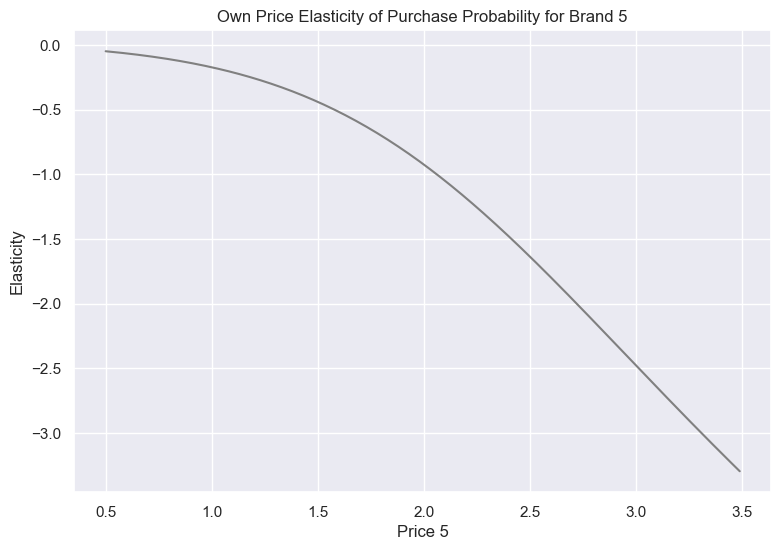

In [117]:
# Plotting the elasticities of brand 5 across diff. price points
plt.figure(figsize = (9, 6))
plt.plot(price_range, own_price_elasticity_brand_5, color = 'grey')
plt.xlabel('Price 5')
plt.ylabel('Elasticity')
plt.title('Own Price Elasticity of Purchase Probability for Brand 5')

#### What would happen to purchase probability of brand 5 if a competitor changed their pricing ?

This is cross price elasticity. 
Think of it as asking:

“If my competitor changes their price, how much does that affect how many of my products people buy?”

Example - Say you own Pepsi, and Coca-Cola raises its price.

If Coca-Cola gets more expensive, some people might switch to Pepsi.

So Pepsi’s sales go up when Coke’s price goes up.

That means the cross price elasticity between Coke and Pepsi is positive — they’re substitutes.

# Cross Price Elasticity Brand 5, Cross Brand 4

In [122]:
df_brand5_cross_brand4 = pd.DataFrame(index = np.arange(price_range.size))
# Cross price elasticity measures the purchase probability for our own brand based on changes in the price of the competitor
df_brand5_cross_brand4['Price_1'] = brand_choice['Price_1'].mean()
df_brand5_cross_brand4['Price_2'] = brand_choice['Price_2'].mean()
df_brand5_cross_brand4['Price_3'] = brand_choice['Price_3'].mean()
df_brand5_cross_brand4['Price_4'] = price_range
df_brand5_cross_brand4['Price_5'] = brand_choice['Price_5'].mean()

In [123]:
df_brand5_cross_brand4.head()

,Price_1,Price_2,Price_3,Price_4,Price_5
0,1.384559,1.764717,2.006694,0.50,2.654296
1,1.384559,1.764717,2.006694,0.51,2.654296
2,1.384559,1.764717,2.006694,0.52,2.654296
3,1.384559,1.764717,2.006694,0.53,2.654296
4,1.384559,1.764717,2.006694,0.54,2.654296


In [124]:
predict_brand5_cross_brand4 = model_brand_choice.predict_proba(df_brand5_cross_brand4)

In [125]:
pr_brand_4 = predict_brand5_cross_brand4[:][:, 3]

In [126]:
# Calculating cross price elasticities
brand5_cross_brand4_price_elasticity = -beta5 * price_range * pr_brand_4

In [127]:
df_price_elasticities['Brand_5_Cross_Brand_4'] = brand5_cross_brand4_price_elasticity
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_4,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4
0,0.50,-0.096401,-0.068948,-0.095627,-0.177588,-0.159237,-0.125757,-0.195684,-0.049055,0.332011
1,0.51,-0.100469,-0.071999,-0.099945,-0.183589,-0.164198,-0.129874,-0.201807,-0.050616,0.337287
2,0.52,-0.104664,-0.075154,-0.104413,-0.189712,-0.169243,-0.134070,-0.208032,-0.052207,0.342507
3,0.53,-0.108990,-0.078416,-0.109036,-0.195957,-0.174373,-0.138346,-0.214360,-0.053827,0.347668
4,0.54,-0.113449,-0.081786,-0.113817,-0.202325,-0.179587,-0.142702,-0.220792,-0.055477,0.352773
5,0.55,-0.118044,-0.085270,-0.118760,-0.208818,-0.184888,-0.147141,-0.227329,-0.057158,0.357820
6,0.56,-0.122779,-0.088869,-0.123871,-0.215438,-0.190275,-0.151663,-0.233972,-0.058871,0.362809
7,0.57,-0.127658,-0.092587,-0.129154,-0.222185,-0.195749,-0.156268,-0.240722,-0.060615,0.367741
8,0.58,-0.132683,-0.096428,-0.134613,-0.229061,-0.201312,-0.160959,-0.247579,-0.062391,0.372614
9,0.59,-0.137858,-0.100394,-0.140254,-0.236068,-0.206963,-0.165735,-0.254544,-0.064199,0.377429


Text(0.5, 1.0, 'Cross Price Elasticity of Brand 5 wrt to Brand 4')

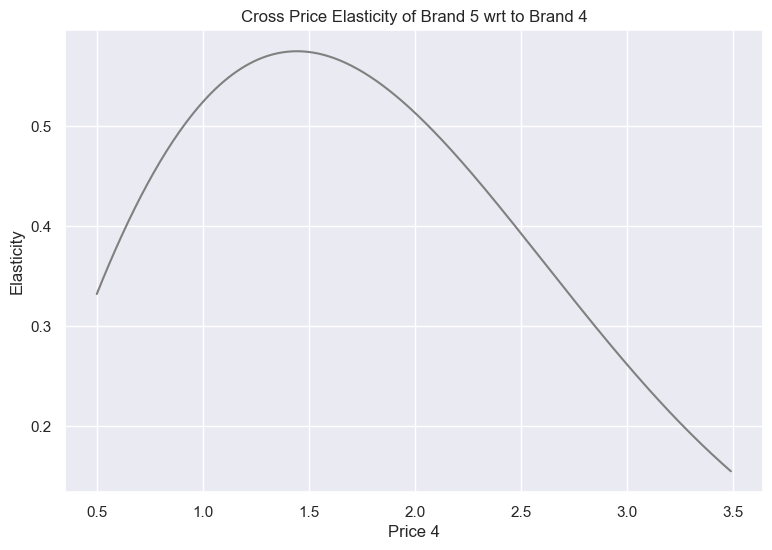

In [128]:
plt.figure(figsize = (9,6))
plt.plot(price_range, brand5_cross_brand4_price_elasticity, color = 'grey')
plt.xlabel('Price 4')
plt.ylabel('Elasticity')
plt.title('Cross Price Elasticity of Brand 5 wrt to Brand 4')

Elasticities are positive across the price range. This indicates that if competitor brand 4 increases prices, the purchase probability for our own brand would increase.

If E (cross band) > 0    --> products are considered as substitute

If | E (cross band) | > | E(own brand) |   --> the competitor brand is considered a strong substitute

#### Key Strategic Conclusion for Brand 5

Brand 5 should pay the most attention when its competitor (Brand 4) prices their product around $1.50. 
Thats when Brand 5 has the biggest opportunity to steal customers from Brand 4. When Brand 4's price is very high like 3.5 dollars, 
Brand 5 might need to worry more about a different, cheaper competitor.

# Own and Cross Price Elasticity by Segment

Targetting the average customer can be hard. No brand can make everyone happy, but a brand can make a certain customer segment happy.
Therefore, we'll refine our own model and compute own and cross price elasticities by customer segments.

### Elite Professionals

Elite Professionals segment has a strong preference for Brand 4.

In [137]:
# Observing purchasing behaviour of this segment wrt to price changes for brand 4
brand_choice_s3 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s3 = brand_choice_s3[brand_choice_s3['Segment'] == 3]

pd.options.display.max_rows = 100
brand_choice_s3

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
101,200000002,6,1,4,1,0,0,1.59,1.87,2.01,...,52,2,159052,2,1,3,False,False,False,True
115,200000002,100,1,4,2,0,0,1.47,1.90,1.95,...,52,2,159052,2,1,3,False,False,False,True
138,200000002,283,1,4,3,0,0,1.37,1.89,2.00,...,52,2,159052,2,1,3,False,False,False,True
141,200000002,307,1,4,1,0,0,1.34,1.89,2.01,...,52,2,159052,2,1,3,False,False,False,True
153,200000002,422,1,4,1,0,0,1.34,1.89,2.02,...,52,2,159052,2,1,3,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57346,200000489,687,1,4,1,4,1,1.50,1.87,2.06,...,44,2,193816,2,1,3,False,False,False,True
57347,200000489,693,1,4,2,4,1,1.42,1.51,2.02,...,44,2,193816,2,1,3,False,False,False,True
57348,200000489,701,1,4,3,4,1,1.42,1.85,1.99,...,44,2,193816,2,1,3,False,False,False,True
57350,200000489,715,1,4,2,0,0,1.50,1.80,2.09,...,44,2,193816,2,1,3,False,False,False,True


In [138]:
# Model estimation
Y = brand_choice_s3['Brand']
brand_choice_s3 = pd.get_dummies(brand_choice_s3, columns = ['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s3[features]
model_brand_choice_s3 = LogisticRegression(solver = 'sag', multi_class= 'multinomial', max_iter = 300)
model_brand_choice_s3.fit(X, Y)

# coefficients table for segment 3
bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s3.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)
bc_coef

,Coef_Brand_1,Coef_Brand_2,Coef_Brand_3,Coef_Brand_4,Coef_Brand_5
Price_1,-2.23,1.22,0.82,0.28,-0.08
Price_2,-0.94,-1.38,1.24,0.78,0.30
Price_3,1.94,-1.67,-0.40,-0.02,0.15
Price_4,2.55,0.58,-0.15,-1.74,-1.23
Price_5,-0.97,-0.36,1.20,0.54,-0.41


### Own Brand Price Elasticity

In [140]:
df_own_brand_5_s3 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s3['Price_1'] = brand_choice_s3['Price_1'].mean()
df_own_brand_5_s3['Price_2'] = brand_choice_s3['Price_2'].mean()
df_own_brand_5_s3['Price_3'] = brand_choice_s3['Price_3'].mean()
df_own_brand_5_s3['Price_4'] = brand_choice_s3['Price_4'].mean()
df_own_brand_5_s3['Price_5'] = price_range

predict_own_brand_5_s3 = model_brand_choice_s3.predict_proba(df_own_brand_5_s3)
pr_own_brand_5_s3 = predict_own_brand_5_s3[:][:, 4]

own_price_elasticity_brand_5_s3 = beta5 * price_range * (1 - pr_own_brand_5_s3)
df_price_elasticities['Brand_5_S3'] = own_price_elasticity_brand_5_s3

### Cross-Brand Price Elasticity

In [142]:
df_brand5_cross_brand4_s3 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s3['Price_1'] = brand_choice_s3['Price_1'].mean()
df_brand5_cross_brand4_s3['Price_2'] = brand_choice_s3['Price_2'].mean()
df_brand5_cross_brand4_s3['Price_3'] = brand_choice_s3['Price_3'].mean()
df_brand5_cross_brand4_s3['Price_4'] = price_range
df_brand5_cross_brand4_s3['Price_5'] = brand_choice_s3['Price_5'].mean()

predict_brand5_cross_brand4_s3 = model_brand_choice_s3.predict_proba(df_brand5_cross_brand4_s3)
pr_cross_brand_5_s3 = predict_brand5_cross_brand4_s3[:][:, 3]

brand5_cross_brand4_price_elasticity_s3 = -beta5 * price_range * pr_cross_brand_5_s3
df_price_elasticities['Brand_5_Cross_Band_4_S3'] = brand5_cross_brand4_price_elasticity_s3
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_4,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand_5_S3,Brand_5_Cross_Band_4_S3
0,0.50,-0.096401,-0.068948,-0.095627,-0.177588,-0.159237,-0.125757,-0.195684,-0.049055,0.332011,-0.316401,0.474975
1,0.51,-0.100469,-0.071999,-0.099945,-0.183589,-0.164198,-0.129874,-0.201807,-0.050616,0.337287,-0.322786,0.484118
2,0.52,-0.104664,-0.075154,-0.104413,-0.189712,-0.169243,-0.134070,-0.208032,-0.052207,0.342507,-0.329179,0.493246
3,0.53,-0.108990,-0.078416,-0.109036,-0.195957,-0.174373,-0.138346,-0.214360,-0.053827,0.347668,-0.335580,0.502357
4,0.54,-0.113449,-0.081786,-0.113817,-0.202325,-0.179587,-0.142702,-0.220792,-0.055477,0.352773,-0.341990,0.511452
...,...,...,...,...,...,...,...,...,...,...,...,...
295,3.45,-8.013298,-8.494670,-9.025266,-5.725355,-4.610390,-4.861716,-4.983309,-3.231572,0.162234,-3.311370,0.185554
296,3.46,-8.038548,-8.521577,-9.052698,-5.744320,-4.627052,-4.879918,-5.000215,-3.247766,0.160333,-3.324546,0.179400
297,3.47,-8.063764,-8.548442,-9.080105,-5.763261,-4.643691,-4.898089,-5.017100,-3.263928,0.158447,-3.337721,0.173422
298,3.48,-8.088946,-8.575267,-9.107487,-5.782177,-4.660308,-4.916229,-5.033966,-3.280058,0.156576,-3.350897,0.167616


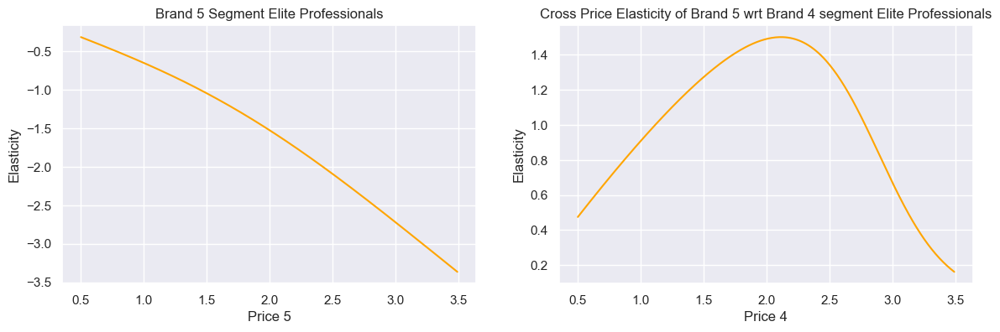

In [143]:
fig, axs = plt.subplots(1, 2, figsize = (14, 4))
axs[0].plot(price_range, own_price_elasticity_brand_5_s3, color = 'orange')
axs[0].set_title('Brand 5 Segment Elite Professionals')
axs[0].set_xlabel('Price 5')

axs[1].plot(price_range, brand5_cross_brand4_price_elasticity_s3, color = 'orange')
axs[1].set_title('Cross Price Elasticity of Brand 5 wrt Brand 4 segment Elite Professionals')
axs[1].set_xlabel('Price 4')

for ax in axs.flat:
    ax.set(ylabel = 'Elasticity')

### Conclusions

Brand 5 becomes even more sensitive to price changes at higher prices. This is typical, as higher prices push customers away more easily.

Price 5 between approximately 2.0 and 2.5. In this key price range, if Brand 5's price increases by 1%, its demand will fall by approximately 1.5% to 2.0%.

When Brand 4 is priced around $2.00, a 1% increase in Brand 4's price causes Brand 5's demand to increase by approximately 1.5%. This is the most sensitive region for competitive pricing between the two brands.

### Overall Strategic Implication

Brand 5's demand is highly sensitive both to its own price and to the price of Brand 4. Any pricing strategy for Brand 5 must carefully consider:

1) Its own price: Since the own-price elasticity is highly negative (elastic), reducing Brand 5's price will likely increase total revenue (as demand increases proportionally more than the price drop).

2) Brand 4's price: Brand 5 benefits most when Brand 4's price is in the $2.00 to $2.50 range, as this is when Brand 4's price changes most strongly drive customers to Brand 5.

### Urban Achievers

In [150]:
brand_choice_s0 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s0 = brand_choice_s0[brand_choice_s0['Segment'] == 0]
brand_choice_s0.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,47,1,110866,1,0,0,True,False,False,False
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,...,47,1,110866,1,0,0,True,False,False,False
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,...,47,1,110866,1,0,0,True,False,False,False
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,...,47,1,110866,1,0,0,True,False,False,False
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,...,47,1,110866,1,0,0,True,False,False,False


In [151]:
Y = brand_choice_s0['Brand']
brand_choice_s0 = pd.get_dummies(brand_choice_s0, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s0[features]
model_brand_choice_s0 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 200)
model_brand_choice_s0.fit(X, Y)

bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s0.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

D:\anaconda\Lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


### Own Brand Price Elasticity

In [153]:
df_own_brand_5_s0 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s0['Price_1'] = brand_choice_s0['Price_1'].mean()
df_own_brand_5_s0['Price_2'] = brand_choice_s0['Price_2'].mean()
df_own_brand_5_s0['Price_3'] = brand_choice_s0['Price_3'].mean()
df_own_brand_5_s0['Price_4'] = brand_choice_s0['Price_4'].mean()
df_own_brand_5_s0['Price_5'] = price_range

predict_own_brand_5_s0 = model_brand_choice_s0.predict_proba(df_own_brand_5_s0)
pr_own_brand_5_s0 = predict_own_brand_5_s0[: ][: , 4]

own_price_elasticity_brand_5_s0 =  beta5 * price_range * (1 - pr_own_brand_5_s0)
df_price_elasticities.insert(10, column = 'Brand_5_S0', value = own_price_elasticity_brand_5_s0)

### Cross-Brand Price Elasticity

In [155]:
df_brand5_cross_brand4_s0 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s0['Price_1'] = brand_choice_s0['Price_1'].mean()
df_brand5_cross_brand4_s0['Price_2'] = brand_choice_s0['Price_2'].mean()
df_brand5_cross_brand4_s0['Price_3'] = brand_choice_s0['Price_3'].mean()
df_brand5_cross_brand4_s0['Price_4'] = price_range
df_brand5_cross_brand4_s0['Price_5'] = brand_choice_s0['Price_5'].mean()

predict_brand5_cross_brand4_s0 = model_brand_choice_s0.predict_proba(df_brand5_cross_brand4_s0)
pr_cross_brand_5_s0 = predict_brand5_cross_brand4_s0[: ][: , 3]

brand5_cross_brand4_price_elasticity_s0 = -beta5 * price_range * pr_cross_brand_5_s0
df_price_elasticities.insert(11, column = 'Brand_5_Cross_Brand_4_S0', value = brand5_cross_brand4_price_elasticity_s0)

### Rural Beginners

In [157]:
brand_choice_s1 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s1 = brand_choice_s1[brand_choice_s1['Segment'] == 1]

In [158]:
Y = brand_choice_s1['Brand']
brand_choice_s1 = pd.get_dummies(brand_choice_s1, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s1[features]
model_brand_choice_s1 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s1.fit(X, Y)

bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s1.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

### Own Brand Price Elasticity

In [160]:
df_own_brand_5_s1 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s1['Price_1'] = brand_choice_s1['Price_1'].mean()
df_own_brand_5_s1['Price_2'] = brand_choice_s1['Price_2'].mean()
df_own_brand_5_s1['Price_3'] = brand_choice_s1['Price_3'].mean()
df_own_brand_5_s1['Price_4'] = brand_choice_s1['Price_4'].mean()
df_own_brand_5_s1['Price_5'] = price_range

predict_own_brand_5_s1 = model_brand_choice_s1.predict_proba(df_own_brand_5_s1)
pr_own_brand_5_s1 = predict_own_brand_5_s1[: ][: , 4]

own_price_elasticity_brand_5_s1 =  beta5 * price_range * (1 - pr_own_brand_5_s1)
df_price_elasticities.insert(12, column = 'Brand 5 S1', value = own_price_elasticity_brand_5_s1)

### Cross-Brand Price Elasticity

In [162]:
df_brand5_cross_brand4_s1 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s1['Price_1'] = brand_choice_s1['Price_1'].mean()
df_brand5_cross_brand4_s1['Price_2'] = brand_choice_s1['Price_2'].mean()
df_brand5_cross_brand4_s1['Price_3'] = brand_choice_s1['Price_3'].mean()
df_brand5_cross_brand4_s1['Price_4'] = price_range
df_brand5_cross_brand4_s1['Price_5'] = brand_choice_s1['Price_5'].mean()

predict_brand5_cross_brand4_s1 = model_brand_choice_s1.predict_proba(df_brand5_cross_brand4_s1)
pr_cross_brand_5_s1 = predict_brand5_cross_brand4_s1[: ][: , 3]

brand5_cross_brand4_price_elasticity_s1 = -beta5 * price_range * pr_cross_brand_5_s1
df_price_elasticities.insert(13, column = 'Brand_5_Cross_Brand_4_S1', value = brand5_cross_brand4_price_elasticity_s1)

### Suburban Families

In [164]:
brand_choice_s2 = df_pa[df_pa['Incidence'] == 1]
brand_choice_s2 = brand_choice_s2[brand_choice_s2['Segment'] == 2]

In [165]:
Y = brand_choice_s2['Brand']
brand_choice_s2 = pd.get_dummies(brand_choice_s2, columns=['Brand'], prefix = 'Brand', prefix_sep = '_')
X = brand_choice_s2[features]
model_brand_choice_s2 = LogisticRegression(solver = 'sag', multi_class = 'multinomial', max_iter = 300)
model_brand_choice_s2.fit(X, Y)

bc_coef = pd.DataFrame(np.transpose(model_brand_choice_s2.coef_))
bc_coef.columns = [coefficients]
bc_coef.index = [prices]
bc_coef = bc_coef.round(2)

### Own-Brand Price Elasticity

In [167]:
df_own_brand_5_s2 = pd.DataFrame(index = np.arange(price_range.size))
df_own_brand_5_s2['Price_1'] = brand_choice_s2['Price_1'].mean()
df_own_brand_5_s2['Price_2'] = brand_choice_s2['Price_2'].mean()
df_own_brand_5_s2['Price_3'] = brand_choice_s2['Price_3'].mean()
df_own_brand_5_s2['Price_4'] = brand_choice_s2['Price_4'].mean()
df_own_brand_5_s2['Price_5'] = price_range

predict_own_brand_5_s2 = model_brand_choice_s2.predict_proba(df_own_brand_5_s2)
pr_own_brand_5_s2 = predict_own_brand_5_s2[: ][: , 4]

own_price_elasticity_brand_5_s2 =  beta5 * price_range * (1 - pr_own_brand_5_s2)
df_price_elasticities.insert(14, column = 'Brand 5 S2', value = own_price_elasticity_brand_5_s2)

### Cross-Brand Price Elasticity

In [169]:
df_brand5_cross_brand4_s2 = pd.DataFrame(index = np.arange(price_range.size))
df_brand5_cross_brand4_s2['Price_1'] = brand_choice_s2['Price_1'].mean()
df_brand5_cross_brand4_s2['Price_2'] = brand_choice_s2['Price_2'].mean()
df_brand5_cross_brand4_s2['Price_3'] = brand_choice_s2['Price_3'].mean()
df_brand5_cross_brand4_s2['Price_4'] = price_range
df_brand5_cross_brand4_s2['Price_5'] = brand_choice_s2['Price_5'].mean()

predict_brand5_cross_brand4_s2 = model_brand_choice_s2.predict_proba(df_brand5_cross_brand4_s2)
pr_cross_brand_5_s2 = predict_brand5_cross_brand4_s2[: ][: , 3]

brand5_cross_brand4_price_elasticity_s2 = -beta5 * price_range * pr_cross_brand_5_s2
df_price_elasticities.insert(15, column = 'Brand_5_Cross_Brand_4_S2', value = brand5_cross_brand4_price_elasticity_s2)
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_4,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand_5_S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand_5_S3,Brand_5_Cross_Band_4_S3
0,0.50,-0.096401,-0.068948,-0.095627,-0.177588,-0.159237,-0.125757,-0.195684,-0.049055,0.332011,-0.035731,0.199391,-0.003330,0.245884,-0.146452,0.184844,-0.316401,0.474975
1,0.51,-0.100469,-0.071999,-0.099945,-0.183589,-0.164198,-0.129874,-0.201807,-0.050616,0.337287,-0.036755,0.201847,-0.003507,0.249022,-0.150067,0.187259,-0.322786,0.484118
2,0.52,-0.104664,-0.075154,-0.104413,-0.189712,-0.169243,-0.134070,-0.208032,-0.052207,0.342507,-0.037793,0.204247,-0.003692,0.252091,-0.153712,0.189627,-0.329179,0.493246
3,0.53,-0.108990,-0.078416,-0.109036,-0.195957,-0.174373,-0.138346,-0.214360,-0.053827,0.347668,-0.038845,0.206593,-0.003886,0.255092,-0.157387,0.191948,-0.335580,0.502357
4,0.54,-0.113449,-0.081786,-0.113817,-0.202325,-0.179587,-0.142702,-0.220792,-0.055477,0.352773,-0.039914,0.208885,-0.004089,0.258023,-0.161093,0.194223,-0.341990,0.511452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,3.45,-8.013298,-8.494670,-9.025266,-5.725355,-4.610390,-4.861716,-4.983309,-3.231572,0.162234,-2.131819,0.056741,-3.727630,0.023293,-3.334089,0.050019,-3.311370,0.185554
296,3.46,-8.038548,-8.521577,-9.052698,-5.744320,-4.627052,-4.879918,-5.000215,-3.247766,0.160333,-2.147839,0.056164,-3.739530,0.022854,-3.349692,0.049440,-3.324546,0.179400
297,3.47,-8.063764,-8.548442,-9.080105,-5.763261,-4.643691,-4.898089,-5.017100,-3.263928,0.158447,-2.163903,0.055591,-3.751400,0.022421,-3.365269,0.048867,-3.337721,0.173422
298,3.48,-8.088946,-8.575267,-9.107487,-5.782177,-4.660308,-4.916229,-5.033966,-3.280058,0.156576,-2.180013,0.055022,-3.763241,0.021995,-3.380819,0.048300,-3.350897,0.167616


Text(0.5, 0, 'Price 4')

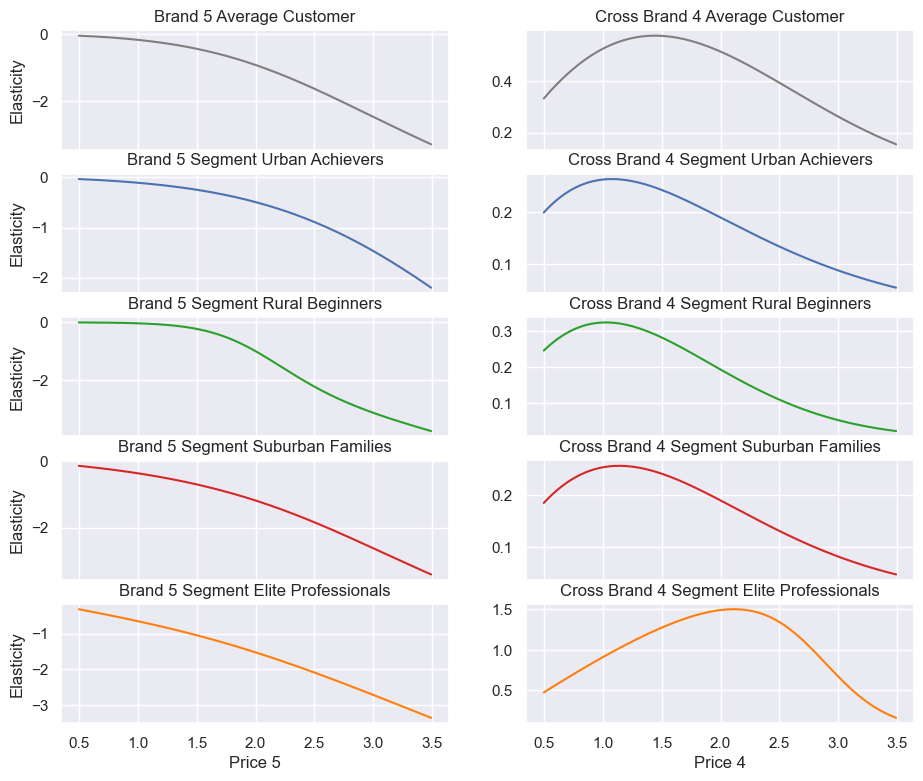

In [170]:
# Plotting all the segments price elasticities
fig1, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 2, figsize = (11, 9), sharex = True)
ax1[0].plot(price_range, own_price_elasticity_brand_5, 'tab:grey')
ax1[0].set_title('Brand 5 Average Customer')
ax1[0].set_ylabel('Elasticity')
ax1[1].plot(price_range, brand5_cross_brand4_price_elasticity, 'tab:grey')
ax1[1].set_title('Cross Brand 4 Average Customer')


ax2[0].plot(price_range, own_price_elasticity_brand_5_s0)
ax2[0].set_title('Brand 5 Segment Urban Achievers')
ax2[0].set_ylabel('Elasticity')
ax2[1].plot(price_range, brand5_cross_brand4_price_elasticity_s0)
ax2[1].set_title('Cross Brand 4 Segment Urban Achievers')

ax3[0].plot(price_range, own_price_elasticity_brand_5_s1, 'tab:green')
ax3[0].set_title('Brand 5 Segment Rural Beginners')
ax3[0].set_ylabel('Elasticity')
ax3[1].plot(price_range, brand5_cross_brand4_price_elasticity_s1, 'tab:green')
ax3[1].set_title('Cross Brand 4 Segment Rural Beginners')

ax4[0].plot(price_range, own_price_elasticity_brand_5_s2, 'tab:red')
ax4[0].set_title('Brand 5 Segment Suburban Families')
ax4[0].set_ylabel('Elasticity')
ax4[1].plot(price_range, brand5_cross_brand4_price_elasticity_s2, 'tab:red')
ax4[1].set_title('Cross Brand 4 Segment Suburban Families')

ax5[0].plot(price_range, own_price_elasticity_brand_5_s3, 'tab:orange')
ax5[0].set_title('Brand 5 Segment Elite Professionals')
ax5[0].set_xlabel('Price 5')
ax5[0].set_ylabel('Elasticity')
ax5[1].plot(price_range, brand5_cross_brand4_price_elasticity_s3, 'tab:orange')
ax5[1].set_title('Cross Brand 4 Segment Elite Professionals')
ax5[1].set_xlabel('Price 4')

#### Brand 5: Own-Price Elasticity

Average Customer: Brand 5 appears to be inelastic (elasticity closer to 0, e.g., $\approx -0.5$ to $-1.5$) at lower prices (around 0.5 to 2.0) and becomes more elastic (steeper negative slope, $\approx -1.5$ to $-3.0$) as the price increases. This suggests that price increases at the lower end don't hurt sales as much as increases at the higher end.

Urban Achievers: This segment is highly inelastic (close to 0) across all observed prices, suggesting they are least sensitive to changes in Brand 5's price.

Rural Beginners: This segment is price-sensitive (elasticity $\approx -1.5$ to $-3.5$) and becomes even more sensitive as the price increases.

Suburban Families: This segment is also quite price-sensitive (elasticity $\approx -1.0$ to $-3.5$), with sensitivity increasing sharply as the price rises.

Elite Professionals: This segment shows a moderate to high degree of price sensitivity (elasticity $\approx -1.0$ to $-3.0$), also increasing with price.

Summary for Brand 5: The Urban Achievers segment is the most price-loyal or least sensitive to Brand 5's own price, while the Rural Beginners and Suburban Families are the most price-sensitive.

#### Brand 4: Cross-Price Elasticity

Average Customer: The substitutability is highest when Brand 4 is at a moderate price (around 1.5 to 2.5), where the cross-elasticity peaks at about 0.5.

Urban Achievers: The cross-elasticity is moderate, peaking around 0.2 at a moderate price for Brand 4. They are less likely to switch than the average customer.

Rural Beginners: This segment shows a moderate level of substitution, peaking around 0.3.

Suburban Families: This segment has a moderate to high cross-elasticity, peaking around 0.3, similar to Rural Beginners.

Elite Professionals: This segment shows the highest degree of substitution. The cross-elasticity peaks around 1.5 when Brand 4 is priced around 2.5. This suggests they are highly likely to switch from Brand 4 to Brand 5 when Brand 4's price increases, especially at a moderate-to-high price point for Brand 4.

Summary for Brand 4 (as a substitute for Brand 5): The Elite Professionals segment views Brand 4 and Brand 5 as the closest substitutes, making them the most likely segment for Brand 5 to gain market share from if Brand 4 raises its price.

### Overall Strategy Implications

Brand 5 Pricing: Brand 5 has the most pricing power with the Urban Achievers segment, as they are the least sensitive to its price.

Competitive Advantage: Targeting Elite Professionals could be highly effective. If Brand 4 raises its price (especially to the 2.0-3.0 range), Brand 5 can expect a significant increase in demand from this segment.

Vulnerable Segments: Price increases for Brand 5 would be most detrimental to sales in the Rural Beginners and Suburban Families segments.

# Modeling Purchase Quantity

We're going to build a statistical model that estimates purchase quantity for each customer on each shopping trip.

### Price Elasticity of Purchase Quantity

In [182]:
df_purchase_quantity = df_pa[df_pa['Incidence'] == 1]
df_purchase_quantity.head()

,ID,Day,Incidence,Brand,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,...,Age,Education,Income,Occupation,Settlement size,Segment,Segment_0,Segment_1,Segment_2,Segment_3
6,200000001,28,1,2,2,0,0,1.50,1.90,1.99,...,47,1,110866,1,0,0,True,False,False,False
11,200000001,58,1,5,1,0,0,1.39,1.90,1.91,...,47,1,110866,1,0,0,True,False,False,False
19,200000001,110,1,1,2,0,0,1.47,1.90,1.99,...,47,1,110866,1,0,0,True,False,False,False
24,200000001,142,1,4,1,0,0,1.21,1.35,1.99,...,47,1,110866,1,0,0,True,False,False,False
29,200000001,183,1,2,3,0,0,1.46,1.88,1.97,...,47,1,110866,1,0,0,True,False,False,False


In [183]:
df_purchase_quantity = pd.get_dummies(df_purchase_quantity, columns = ['Brand'], prefix = 'Brand', prefix_sep = '_')
df_purchase_quantity.describe()

,ID,Day,Incidence,Quantity,Last_Inc_Brand,Last_Inc_Quantity,Price_1,Price_2,Price_3,Price_4,...,Promotion_4,Promotion_5,Sex,Marital status,Age,Education,Income,Occupation,Settlement size,Segment
count,1.463800e+04,14638.000000,14638.0,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,...,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000,14638.000000
mean,2.000003e+08,359.607597,1.0,2.774559,1.535251,0.406955,1.384559,1.764717,2.006694,2.159658,...,0.128091,0.045430,0.357289,0.385162,40.346905,1.151045,126706.452043,0.845471,0.797513,1.255431
std,1.423786e+02,205.346253,0.0,1.796736,2.060858,0.491283,0.090944,0.181667,0.046200,0.093253,...,0.334203,0.208252,0.479217,0.486650,12.346284,0.634625,39935.109358,0.633840,0.810358,1.159187
min,2.000000e+08,1.000000,1.0,1.000000,0.000000,0.000000,1.100000,1.260000,1.870000,1.760000,...,0.000000,0.000000,0.000000,0.000000,18.000000,0.000000,38247.000000,0.000000,0.000000,0.000000
25%,2.000001e+08,175.000000,1.0,2.000000,0.000000,0.000000,1.340000,1.570000,1.970000,2.120000,...,0.000000,0.000000,0.000000,0.000000,31.000000,1.000000,102723.000000,0.000000,0.000000,0.000000
50%,2.000003e+08,355.000000,1.0,2.000000,0.000000,0.000000,1.390000,1.880000,2.010000,2.180000,...,0.000000,0.000000,0.000000,0.000000,37.000000,1.000000,122895.000000,1.000000,1.000000,1.000000
75%,2.000004e+08,532.000000,1.0,3.000000,4.000000,1.000000,1.470000,1.890000,2.060000,2.240000,...,0.000000,0.000000,1.000000,1.000000,49.000000,2.000000,147967.000000,1.000000,1.000000,2.000000
max,2.000005e+08,727.000000,1.0,15.000000,5.000000,1.000000,1.590000,1.900000,2.140000,2.260000,...,1.000000,1.000000,1.000000,1.000000,75.000000,3.000000,309364.000000,2.000000,2.000000,3.000000


From quantity column, we expect that on many purchase occasions more than one chocolate candy bar was purchased.

In [185]:
# What features can influence purchase quantity ?
df_purchase_quantity.columns.values

array(['ID', 'Day', 'Incidence', 'Quantity', 'Last_Inc_Brand',
       'Last_Inc_Quantity', 'Price_1', 'Price_2', 'Price_3', 'Price_4',
       'Price_5', 'Promotion_1', 'Promotion_2', 'Promotion_3',
       'Promotion_4', 'Promotion_5', 'Sex', 'Marital status', 'Age',
       'Education', 'Income', 'Occupation', 'Settlement size', 'Segment',
       'Segment_0', 'Segment_1', 'Segment_2', 'Segment_3', 'Brand_1',
       'Brand_2', 'Brand_3', 'Brand_4', 'Brand_5'], dtype=object)

In [186]:
# We need to know which brand was chosen and what the price of that brand was at this point in time
df_purchase_quantity['Price_Incidence'] = (df_purchase_quantity['Brand_1'] * df_purchase_quantity['Price_1'] + 
                                           df_purchase_quantity['Brand_2'] * df_purchase_quantity['Price_2'] + 
                                           df_purchase_quantity['Brand_3'] * df_purchase_quantity['Price_3'] + 
                                           df_purchase_quantity['Brand_4'] * df_purchase_quantity['Price_4'] + 
                                           df_purchase_quantity['Brand_5'] * df_purchase_quantity['Price_5'])

In [187]:
# Creating a variable which indicates whether the chosen brand is on promotion or not
df_purchase_quantity['Promotion_Incidence'] = (df_purchase_quantity['Brand_1'] * df_purchase_quantity['Promotion_1'] + 
                                               df_purchase_quantity['Brand_2'] * df_purchase_quantity['Promotion_2'] + 
                                               df_purchase_quantity['Brand_3'] * df_purchase_quantity['Promotion_3'] + 
                                               df_purchase_quantity['Brand_4'] * df_purchase_quantity['Promotion_4'] + 
                                               df_purchase_quantity['Brand_5'] * df_purchase_quantity['Promotion_5'])

# Model Estimation. Linear Regression

In [189]:
X = df_purchase_quantity[['Price_Incidence', 'Promotion_Incidence']]
X

,Price_Incidence,Promotion_Incidence
6,1.90,0
11,2.62,1
19,1.47,0
24,2.16,0
29,1.88,0
...,...,...
58621,1.89,0
58648,1.35,1
58674,1.85,1
58687,1.51,0


In [190]:
Y = df_purchase_quantity['Quantity']
Y

6         2
11        1
19        2
24        1
29        3
         ..
58621     6
58648    12
58674     7
58687     6
58691     3
Name: Quantity, Length: 14638, dtype: int64

In [191]:
model_quantity = LinearRegression()
model_quantity.fit(X, Y)

LinearRegression()

In [192]:
model_quantity.coef_

array([-0.8173651 , -0.10504673])

In [193]:
# First coefficient refers to Price Incidence - For every dollar increase in price, about 0.82 units less chocolate candy bars could be bought.
# Second coefficient refers to Promotion Incidence - If there is a promotion, about 0.11 units less would be bought.

Interestingly, people would buy a bit less if there is a promotion. It is because our model is quite simplified as we've only got 2 predictors.

#### Hypotheses

Maybe some important information is missing in our dataset.

Currently, we're considering the average customer and not any particular segment.

Another reason could be that a promotion is prompting a customer to try out a new brand. In that case, we would not expect them to buy many chocolate bars, but a single one.

# Price Elasticity Estimation

Price elasticity of purchase quantity - it’s a measure of whether people will buy more or less of something if its price goes up or down.

Price elasticity of purchase quantity - % change in purchase quantity in response to a 1% change in the unit price of the chosen brand.

In [202]:
df_price_elasticities_quantity = pd.DataFrame(index = np.arange(price_range.size))
df_price_elasticities_quantity['Price_Incidence'] = price_range
df_price_elasticities_quantity['Promotion_Incidence'] = 1

In [203]:
beta_quantity = model_quantity.coef_[0]

In [204]:
predict_quantity = model_quantity.predict(df_price_elasticities_quantity)

In [205]:
price_elasticity_quantity_promotion_yes = beta_quantity * price_range / predict_quantity

In [206]:
df_price_elasticities['PE_Quantity_Promotion_1'] = price_elasticity_quantity_promotion_yes

In [207]:
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_4,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand_5_S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand_5_S3,Brand_5_Cross_Band_4_S3,PE_Quantity_Promotion_1
0,0.50,-0.096401,-0.068948,-0.095627,-0.177588,-0.159237,-0.125757,-0.195684,-0.049055,0.332011,-0.035731,0.199391,-0.003330,0.245884,-0.146452,0.184844,-0.316401,0.474975,-0.102157
1,0.51,-0.100469,-0.071999,-0.099945,-0.183589,-0.164198,-0.129874,-0.201807,-0.050616,0.337287,-0.036755,0.201847,-0.003507,0.249022,-0.150067,0.187259,-0.322786,0.484118,-0.104413
2,0.52,-0.104664,-0.075154,-0.104413,-0.189712,-0.169243,-0.134070,-0.208032,-0.052207,0.342507,-0.037793,0.204247,-0.003692,0.252091,-0.153712,0.189627,-0.329179,0.493246,-0.106679
3,0.53,-0.108990,-0.078416,-0.109036,-0.195957,-0.174373,-0.138346,-0.214360,-0.053827,0.347668,-0.038845,0.206593,-0.003886,0.255092,-0.157387,0.191948,-0.335580,0.502357,-0.108954
4,0.54,-0.113449,-0.081786,-0.113817,-0.202325,-0.179587,-0.142702,-0.220792,-0.055477,0.352773,-0.039914,0.208885,-0.004089,0.258023,-0.161093,0.194223,-0.341990,0.511452,-0.111238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,3.45,-8.013298,-8.494670,-9.025266,-5.725355,-4.610390,-4.861716,-4.983309,-3.231572,0.162234,-2.131819,0.056741,-3.727630,0.023293,-3.334089,0.050019,-3.311370,0.185554,-1.774292
296,3.46,-8.038548,-8.521577,-9.052698,-5.744320,-4.627052,-4.879918,-5.000215,-3.247766,0.160333,-2.147839,0.056164,-3.739530,0.022854,-3.349692,0.049440,-3.324546,0.179400,-1.788634
297,3.47,-8.063764,-8.548442,-9.080105,-5.763261,-4.643691,-4.898089,-5.017100,-3.263928,0.158447,-2.163903,0.055591,-3.751400,0.022421,-3.365269,0.048867,-3.337721,0.173422,-1.803124
298,3.48,-8.088946,-8.575267,-9.107487,-5.782177,-4.660308,-4.916229,-5.033966,-3.280058,0.156576,-2.180013,0.055022,-3.763241,0.021995,-3.380819,0.048300,-3.350897,0.167616,-1.817766


Text(0.5, 1.0, 'Price Elasticity of Purchase Quantity with Promotion')

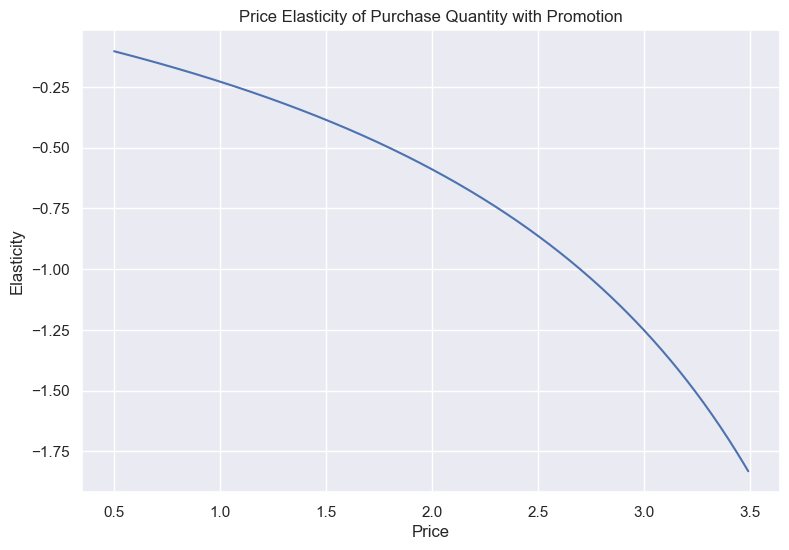

In [208]:
plt.figure(figsize= (9, 6))
plt.plot(price_range, price_elasticity_quantity_promotion_yes)
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Quantity with Promotion')

In [209]:
# Overwrite promotion incidence in order to use the name df
df_price_elasticities_quantity['Promotion_Incidence'] = 0
# Find the new predicted quantities
predict_quantity = model_quantity.predict(df_price_elasticities_quantity)
# Calculate the new price elasticities
price_elasticity_quantity_promotion_no = beta_quantity * price_range / predict_quantity
# Add the results to the master data frame
df_price_elasticities['PE_Quantity_Promotion_0'] = price_elasticity_quantity_promotion_no
df_price_elasticities

,Price_Point,Mean_PE,PE_Segment_1,PE_Segment_2,PE_Segment_3,PE_Segment_4,Elasticity_Promotion_1,Elasticity_Promotion_0,Brand_5,Brand_5_Cross_Brand_4,Brand_5_S0,Brand_5_Cross_Brand_4_S0,Brand 5 S1,Brand_5_Cross_Brand_4_S1,Brand 5 S2,Brand_5_Cross_Brand_4_S2,Brand_5_S3,Brand_5_Cross_Band_4_S3,PE_Quantity_Promotion_1,PE_Quantity_Promotion_0
0,0.50,-0.096401,-0.068948,-0.095627,-0.177588,-0.159237,-0.125757,-0.195684,-0.049055,0.332011,-0.035731,0.199391,-0.003330,0.245884,-0.146452,0.184844,-0.316401,0.474975,-0.102157,-0.099543
1,0.51,-0.100469,-0.071999,-0.099945,-0.183589,-0.164198,-0.129874,-0.201807,-0.050616,0.337287,-0.036755,0.201847,-0.003507,0.249022,-0.150067,0.187259,-0.322786,0.484118,-0.104413,-0.101736
2,0.52,-0.104664,-0.075154,-0.104413,-0.189712,-0.169243,-0.134070,-0.208032,-0.052207,0.342507,-0.037793,0.204247,-0.003692,0.252091,-0.153712,0.189627,-0.329179,0.493246,-0.106679,-0.103939
3,0.53,-0.108990,-0.078416,-0.109036,-0.195957,-0.174373,-0.138346,-0.214360,-0.053827,0.347668,-0.038845,0.206593,-0.003886,0.255092,-0.157387,0.191948,-0.335580,0.502357,-0.108954,-0.106150
4,0.54,-0.113449,-0.081786,-0.113817,-0.202325,-0.179587,-0.142702,-0.220792,-0.055477,0.352773,-0.039914,0.208885,-0.004089,0.258023,-0.161093,0.194223,-0.341990,0.511452,-0.111238,-0.108369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
295,3.45,-8.013298,-8.494670,-9.025266,-5.725355,-4.610390,-4.861716,-4.983309,-3.231572,0.162234,-2.131819,0.056741,-3.727630,0.023293,-3.334089,0.050019,-3.311370,0.185554,-1.774292,-1.664290
296,3.46,-8.038548,-8.521577,-9.052698,-5.744320,-4.627052,-4.879918,-5.000215,-3.247766,0.160333,-2.147839,0.056164,-3.739530,0.022854,-3.349692,0.049440,-3.324546,0.179400,-1.788634,-1.677205
297,3.47,-8.063764,-8.548442,-9.080105,-5.763261,-4.643691,-4.898089,-5.017100,-3.263928,0.158447,-2.163903,0.055591,-3.751400,0.022421,-3.365269,0.048867,-3.337721,0.173422,-1.803124,-1.690246
298,3.48,-8.088946,-8.575267,-9.107487,-5.782177,-4.660308,-4.916229,-5.033966,-3.280058,0.156576,-2.180013,0.055022,-3.763241,0.021995,-3.380819,0.048300,-3.350897,0.167616,-1.817766,-1.703414


Text(0.5, 1.0, 'Price Elasticity of Purchase Quantity with Promotion')

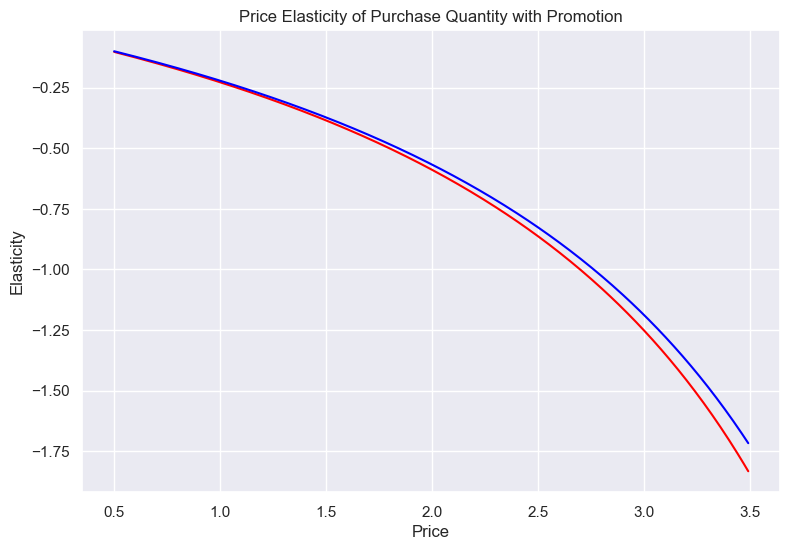

In [210]:
plt.figure(figsize= (9, 6))
plt.plot(price_range, price_elasticity_quantity_promotion_yes, color = 'red')
plt.plot(price_range, price_elasticity_quantity_promotion_no, color = 'blue')
plt.xlabel('Price')
plt.ylabel('Elasticity')
plt.title('Price Elasticity of Purchase Quantity with Promotion')

Customers are a tiny bit more elastic when there is a promotion.

However, overall customers are inelastic towards purchase quantity for all prices from around 0.5$ to 2.7.

So promotion doesn't look like such a big factor either. The two lines almost overlap at many of the price points.

The reason might be that the variables we included in our model hold no predictive value.

Therefore, it might seem like it doesn't really make sense to focus too much on the purchase quantity.
Neither price nor promotion shifts appear to affect the customer's decision.